<a href="https://www.kaggle.com/code/lrntszab/vehicle-detection-detectron2?scriptVersionId=173811019" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Detectron2 Installation

In [1]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

# Importing

In [2]:
import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data import transforms as T
from detectron2.data import build_detection_train_loader
from detectron2.data import DatasetMapper


SEED = 13
THRESHOLD = 0.75

detectron2 version: 0.6


# Register the custom dataset

In [3]:
from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

for d in ["train", "valid", "test"]:
    register_coco_instances(f"vehicles_{d}", {},
                            f"/kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/{d}/_annotations.coco.json",
                            f"/kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/{d}")

# Data inspection

WARNING [04/24 21:53:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/24 21:53:15 d2.data.datasets.coco]: Loaded 102 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/train/_annotations.coco.json


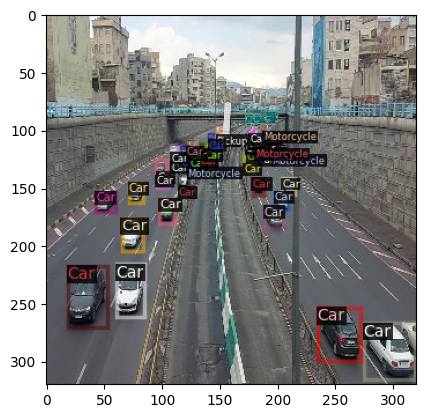

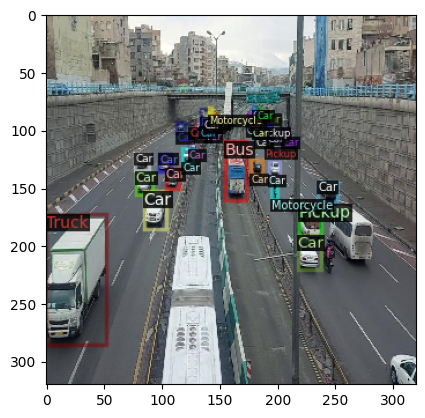

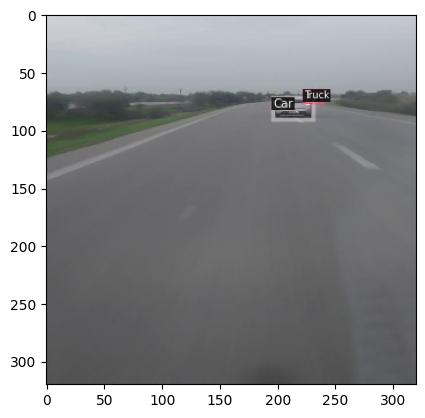

In [4]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("vehicles_train")
dataset_dicts = DatasetCatalog.get("vehicles_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    final_image = vis.get_image()
    imgplot = plt.imshow(final_image)
    plt.show()

# Define custom trainer to apply custom data augmentations

In [5]:
class MyTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        mapper = DatasetMapper(cfg, is_train=True, augmentations=[T.Resize((128, 128)),
                                                                  T.RandomBrightness(0.9, 1.1),
                                                                  T.RandomFlip(prob=0.5)])
        return build_detection_train_loader(cfg, mapper=mapper)

# Training

In [6]:
from detectron2.engine import DefaultTrainer

EPOCHS = 500
BASE_LR = 0.001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("vehicles_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.DEVICE = "cuda:0"
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/24 21:53:18 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:01, 262MB/s]                           


[04/24 21:53:20 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[04/24 21:53:27 d2.utils.events]:  eta: 0:01:08  iter: 19  total_loss: 3.336  loss_cls: 1.928  loss_box_reg: 0.3105  loss_rpn_cls: 0.6709  loss_rpn_loc: 0.429    time: 0.1478  last_time: 0.1449  data_time: 0.0109  last_data_time: 0.0037   lr: 3.8962e-05  max_mem: 1634M


2024-04-24 21:53:29.081078: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-24 21:53:29.081179: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-24 21:53:29.206322: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


[04/24 21:53:40 d2.utils.events]:  eta: 0:01:07  iter: 39  total_loss: 1.932  loss_cls: 0.8257  loss_box_reg: 0.2517  loss_rpn_cls: 0.4022  loss_rpn_loc: 0.4328    time: 0.1484  last_time: 0.1419  data_time: 0.0044  last_data_time: 0.0041   lr: 7.8922e-05  max_mem: 1634M
[04/24 21:53:43 d2.utils.events]:  eta: 0:01:04  iter: 59  total_loss: 1.27  loss_cls: 0.4676  loss_box_reg: 0.2371  loss_rpn_cls: 0.2406  loss_rpn_loc: 0.3636    time: 0.1490  last_time: 0.1433  data_time: 0.0046  last_data_time: 0.0042   lr: 0.00011888  max_mem: 1634M
[04/24 21:53:46 d2.utils.events]:  eta: 0:01:01  iter: 79  total_loss: 1.397  loss_cls: 0.4385  loss_box_reg: 0.2973  loss_rpn_cls: 0.236  loss_rpn_loc: 0.3756    time: 0.1485  last_time: 0.1408  data_time: 0.0049  last_data_time: 0.0040   lr: 0.00015884  max_mem: 1634M
[04/24 21:53:49 d2.utils.events]:  eta: 0:00:58  iter: 99  total_loss: 1.179  loss_cls: 0.3327  loss_box_reg: 0.2548  loss_rpn_cls: 0.1902  loss_rpn_loc: 0.3388    time: 0.1489  last_tim

In [7]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[04/24 21:54:51 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Evaluation

In [8]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("vehicles_valid", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "vehicles_valid")
inference_on_dataset(trainer.model, test_loader, evaluator)

[04/24 21:54:52 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/24 21:54:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/24 21:54:52 d2.data.datasets.coco]: Loaded 28 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/valid/_annotations.coco.json
[04/24 21:54:52 d2.data.build]: Distribution of instances among all 6 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    cars    | 0            |    Bus     | 6            |    Car     | 398          |
| Motorcycle | 92           |   Pickup   | 59           |   Truck    | 8            |
|            |              |            |              |            |              |
|   total    | 563 

OrderedDict([('bbox',
              {'AP': 4.941399986038567,
               'AP50': 12.46330224375515,
               'AP75': 3.1163705099766443,
               'APs': 4.402366648321248,
               'APm': 11.986541060605058,
               'APl': 28.014003323409263,
               'AP-cars': nan,
               'AP-Bus': 0.0,
               'AP-Car': 21.17004895463373,
               'AP-Motorcycle': 0.8044554455445545,
               'AP-Pickup': 1.5680167640416898,
               'AP-Truck': 1.1644787659728553})])

In [9]:
evaluator = COCOEvaluator("vehicles_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "vehicles_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

[04/24 21:54:56 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/24 21:54:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/24 21:54:57 d2.data.datasets.coco]: Loaded 13 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/_annotations.coco.json
[04/24 21:54:57 d2.data.build]: Distribution of instances among all 6 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    cars    | 0            |    Bus     | 5            |    Car     | 179          |
| Motorcycle | 38           |   Pickup   | 29           |   Truck    | 3            |
|            |              |            |              |            |              |
|   total    | 254  

OrderedDict([('bbox',
              {'AP': 4.786642121664012,
               'AP50': 11.252788086022687,
               'AP75': 3.1600668194241415,
               'APs': 3.6509648928829708,
               'APm': 14.053693450734524,
               'APl': 50.0990099009901,
               'AP-cars': nan,
               'AP-Bus': 0.0,
               'AP-Car': 19.39397576378298,
               'AP-Motorcycle': 0.0,
               'AP-Pickup': 2.2950104220948413,
               'AP-Truck': 2.244224422442244})])

# Making Predictions

In [10]:
my_dataset_test_metadata = MetadataCatalog.get("vehicles_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("vehicles_test")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (10,20), dpi = 200)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)

WARNING [04/24 21:54:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/24 21:54:59 d2.data.datasets.coco]: Loaded 13 images in COCO format from /kaggle/input/vehicle-detection-image-dataset/No_Apply_Grayscale/No_Apply_Grayscale/Vehicles_Detection.v8i.coco/test/_annotations.coco.json


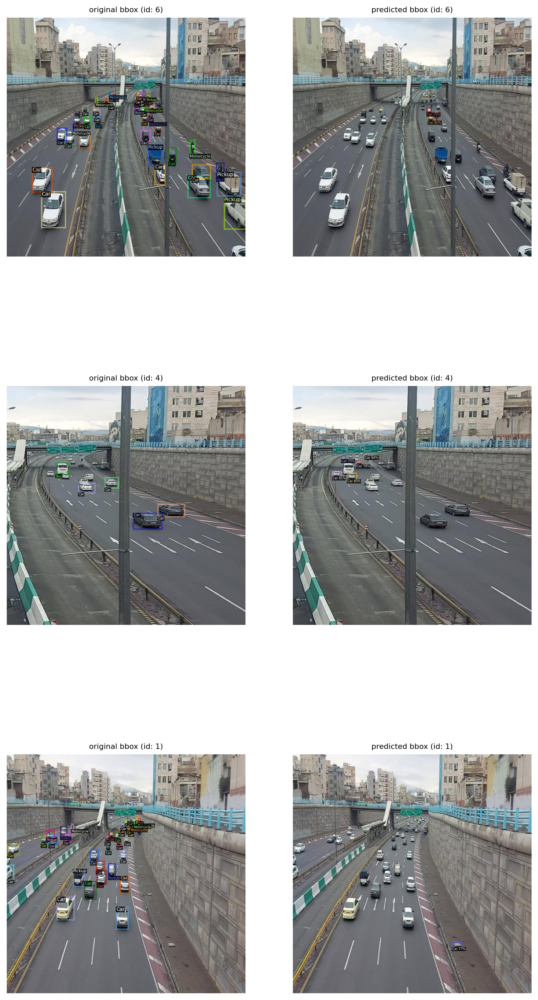

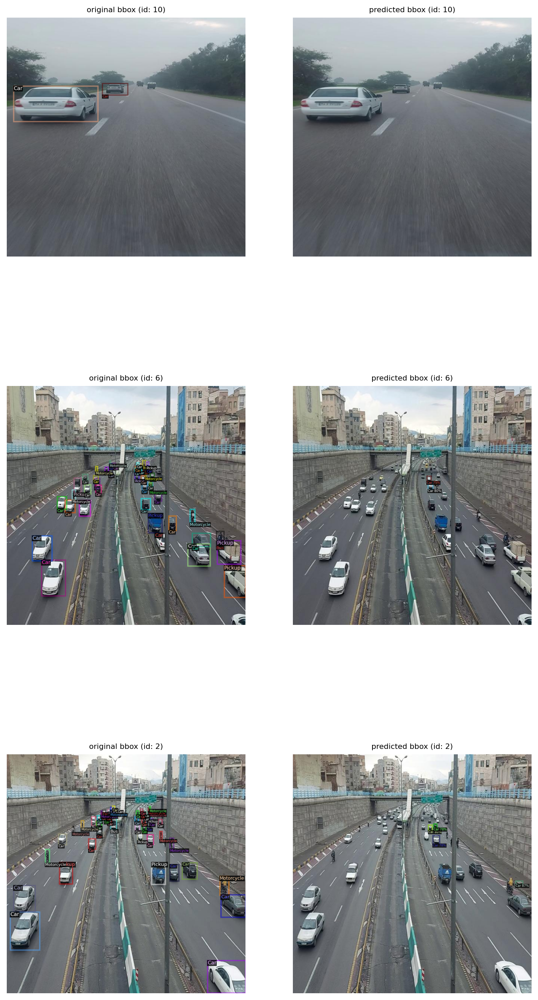

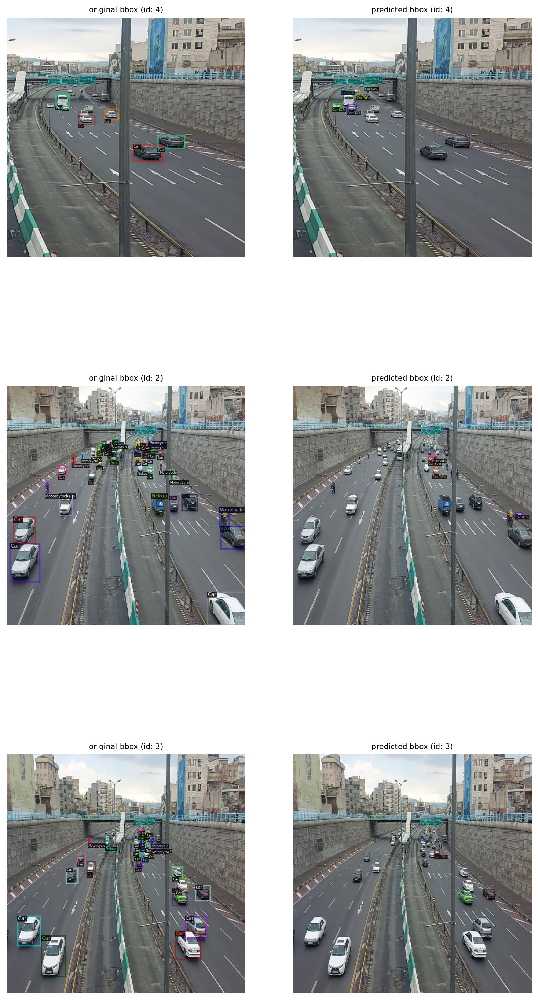

In [11]:
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 3, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 74, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 65, image_scale=1)